In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, roc_curve, auc
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVC

from sklearn.model_selection import cross_val_score

from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam

Using TensorFlow backend.


In [2]:
df = pd.read_csv('../data_sets/high_diamond_ranked_10min.csv')
df

,gameId,blueWins,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,...,redTowersDestroyed,redTotalGold,redAvgLevel,redTotalExperience,redTotalMinionsKilled,redTotalJungleMinionsKilled,redGoldDiff,redExperienceDiff,redCSPerMin,redGoldPerMin
0,4519157822,0,28,2,1,9,6,11,0,0,...,0,16567,6.8,17047,197,55,-643,8,19.7,1656.7
1,4523371949,0,12,1,0,5,5,5,0,0,...,1,17620,6.8,17438,240,52,2908,1173,24.0,1762.0
2,4521474530,0,15,0,0,7,11,4,1,1,...,0,17285,6.8,17254,203,28,1172,1033,20.3,1728.5
3,4524384067,0,43,1,0,4,5,5,1,0,...,0,16478,7.0,17961,235,47,1321,7,23.5,1647.8
4,4436033771,0,75,4,0,6,6,6,0,0,...,0,17404,7.0,18313,225,67,1004,-230,22.5,1740.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9874,4527873286,1,17,2,1,7,4,5,1,1,...,0,15246,6.8,16498,229,34,-2519,-2469,22.9,1524.6
9875,4527797466,1,54,0,0,6,4,8,1,1,...,0,15456,7.0,18367,206,56,-782,-888,20.6,1545.6
9876,4527713716,0,23,1,0,6,7,5,0,0,...,0,18319,7.4,19909,261,60,2416,1877,26.1,1831.9
9877,4527628313,0,14,4,1,2,3,3,1,1,...,0,15298,7.2,18314,247,40,839,1085,24.7,1529.8


### info data sheet
Dit is een giga datasheet Het belangerijkesten is dat we het eerst goed schoon maken om te kijken welken data we
echt kunnen gebruiken en wat niet.

Deze data sheet is van een spellen dat best gecompliseert is.
in het spel heb je 2 teams die tegen makaar spelen iets dat meteen op valt is dat veel van de zelften dingen
in bijden teams word gebreukt. Dus ik ga wat extra feature maken hier op ga baseert waar deze worden
vegelijken met mekaar en als bij voor beelt blue mear wards heeft ge destroyes dan maak ik wards destryed 1 en ander 0
om het simpelenr te maken voor het net werk ik graag zie wat voor een verschil dit maakt.

Voorspeling is wie wint<br/>
Blue = 1 <br/>
red = 0

In [3]:
df = df.drop(['gameId'],axis = 1, inplace = False)
#hoe veel porsent mist er
round(100* (df.isna().sum() / df.shape[0]))
# er mist net niks dus daar ben ik blij mee

blueWins                        0.0
blueWardsPlaced                 0.0
blueWardsDestroyed              0.0
blueFirstBlood                  0.0
blueKills                       0.0
blueDeaths                      0.0
blueAssists                     0.0
blueEliteMonsters               0.0
blueDragons                     0.0
blueHeralds                     0.0
blueTowersDestroyed             0.0
blueTotalGold                   0.0
blueAvgLevel                    0.0
blueTotalExperience             0.0
blueTotalMinionsKilled          0.0
blueTotalJungleMinionsKilled    0.0
blueGoldDiff                    0.0
blueExperienceDiff              0.0
blueCSPerMin                    0.0
blueGoldPerMin                  0.0
redWardsPlaced                  0.0
redWardsDestroyed               0.0
redFirstBlood                   0.0
redKills                        0.0
redDeaths                       0.0
redAssists                      0.0
redEliteMonsters                0.0
redDragons                  

In [4]:
df.info()
#Veder zie ik geen data opject dus dat maakt het nog makijker

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9879 entries, 0 to 9878
Data columns (total 39 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   blueWins                      9879 non-null   int64  
 1   blueWardsPlaced               9879 non-null   int64  
 2   blueWardsDestroyed            9879 non-null   int64  
 3   blueFirstBlood                9879 non-null   int64  
 4   blueKills                     9879 non-null   int64  
 5   blueDeaths                    9879 non-null   int64  
 6   blueAssists                   9879 non-null   int64  
 7   blueEliteMonsters             9879 non-null   int64  
 8   blueDragons                   9879 non-null   int64  
 9   blueHeralds                   9879 non-null   int64  
 10  blueTowersDestroyed           9879 non-null   int64  
 11  blueTotalGold                 9879 non-null   int64  
 12  blueAvgLevel                  9879 non-null   float64
 13  blu

In [5]:
#ik wil graag zien hoe vaak wat win
red_win= df[df['blueWins']== 0]
blue_win = df[df['blueWins']== 1]
print('red_win',round(100* (len(red_win)/df.shape[0])), '%')
print('blue_win',round(100* (len(blue_win)/df.shape[0])), '%')
# We hebben een super mooien verdeling van 50% dus we hoeven ons geen zoregn te maken over een ongelijken verdeling
#of een bise in de dataset

red_win 50 %
blue_win 50 %


list of dingen die voor beiden teams gelt:
- blueWins word Wins
- blueFirstBlood word FirstBlood
- redFirstBlood mag weg
- redKills = blueDeaths
- winning in Gold = redTotalGold vs blueTotalGold

In [6]:
df = df.rename(columns={'blueWins':'teamwins','blueFirstBlood':'FirstBlood'})
df = df.drop(['redFirstBlood'],axis = 1, inplace = False)
df

,teamwins,blueWardsPlaced,blueWardsDestroyed,FirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeralds,...,redTowersDestroyed,redTotalGold,redAvgLevel,redTotalExperience,redTotalMinionsKilled,redTotalJungleMinionsKilled,redGoldDiff,redExperienceDiff,redCSPerMin,redGoldPerMin
0,0,28,2,1,9,6,11,0,0,0,...,0,16567,6.8,17047,197,55,-643,8,19.7,1656.7
1,0,12,1,0,5,5,5,0,0,0,...,1,17620,6.8,17438,240,52,2908,1173,24.0,1762.0
2,0,15,0,0,7,11,4,1,1,0,...,0,17285,6.8,17254,203,28,1172,1033,20.3,1728.5
3,0,43,1,0,4,5,5,1,0,1,...,0,16478,7.0,17961,235,47,1321,7,23.5,1647.8
4,0,75,4,0,6,6,6,0,0,0,...,0,17404,7.0,18313,225,67,1004,-230,22.5,1740.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9874,1,17,2,1,7,4,5,1,1,0,...,0,15246,6.8,16498,229,34,-2519,-2469,22.9,1524.6
9875,1,54,0,0,6,4,8,1,1,0,...,0,15456,7.0,18367,206,56,-782,-888,20.6,1545.6
9876,0,23,1,0,6,7,5,0,0,0,...,0,18319,7.4,19909,261,60,2416,1877,26.1,1831.9
9877,0,14,4,1,2,3,3,1,1,0,...,0,15298,7.2,18314,247,40,839,1085,24.7,1529.8


In [7]:
#heb het gevoel dat ik het dit vaker nodig gaat zijn dus maar een functie
def vergelijker(columns_blue,columns_red,new_Columns_name):
   df[new_Columns_name]= np.where(df[columns_blue] > df[columns_red],1,0)
   data = df.drop([columns_blue,columns_red],axis=1,inplace = False)
   return data

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9879 entries, 0 to 9878
Data columns (total 38 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   teamwins                      9879 non-null   int64  
 1   blueWardsPlaced               9879 non-null   int64  
 2   blueWardsDestroyed            9879 non-null   int64  
 3   FirstBlood                    9879 non-null   int64  
 4   blueKills                     9879 non-null   int64  
 5   blueDeaths                    9879 non-null   int64  
 6   blueAssists                   9879 non-null   int64  
 7   blueEliteMonsters             9879 non-null   int64  
 8   blueDragons                   9879 non-null   int64  
 9   blueHeralds                   9879 non-null   int64  
 10  blueTowersDestroyed           9879 non-null   int64  
 11  blueTotalGold                 9879 non-null   int64  
 12  blueAvgLevel                  9879 non-null   float64
 13  blu

In [9]:
#vergelijker(columns_blue='',columns_red='',new_Columns_name='')
df = vergelijker(columns_blue='blueWardsDestroyed',columns_red ='redWardsDestroyed',new_Columns_name ='WardsDestroyed')
df = vergelijker(columns_blue='blueKills',columns_red ='redKills',new_Columns_name ='more_Kills' )
df = vergelijker(columns_blue='blueWardsPlaced',columns_red ='redWardsPlaced',new_Columns_name ='won_team_WardsPlaced')
df = vergelijker(columns_blue='blueDragons',columns_red='redDragons',new_Columns_name='Dragons_Winning')
df = vergelijker(columns_blue='blueHeralds',columns_red='redHeralds',new_Columns_name='Heralds_Winning')
df = vergelijker(columns_blue='blueEliteMonsters',columns_red='redEliteMonsters',new_Columns_name='EliteMonsters')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9879 entries, 0 to 9878
Data columns (total 32 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   teamwins                      9879 non-null   int64  
 1   FirstBlood                    9879 non-null   int64  
 2   blueDeaths                    9879 non-null   int64  
 3   blueAssists                   9879 non-null   int64  
 4   blueTowersDestroyed           9879 non-null   int64  
 5   blueTotalGold                 9879 non-null   int64  
 6   blueAvgLevel                  9879 non-null   float64
 7   blueTotalExperience           9879 non-null   int64  
 8   blueTotalMinionsKilled        9879 non-null   int64  
 9   blueTotalJungleMinionsKilled  9879 non-null   int64  
 10  blueGoldDiff                  9879 non-null   int64  
 11  blueExperienceDiff            9879 non-null   int64  
 12  blueCSPerMin                  9879 non-null   float64
 13  blu

## plotten
Een klein dingeteje is als je de meesten tower destriyed ben je meestal aan de winndenden hand dus weet niet of dat ik
dit echt kan gebruiken
diegen die intresant zijn:
- TowersDestroyed_Winning
- TotalGold
- TotalMinionsKilled
- GoldPerMin

In [10]:
import plotly.express as px
fig = px.scatter(df, x="blueTotalMinionsKilled", y="blueGoldPerMin",color="teamwins"
                ,trendline='ols',
                 trendline_color_override='green',
                 hover_data= ['WardsDestroyed','more_Kills','won_team_WardsPlaced','Dragons_Winning',
                              'Heralds_Winning','EliteMonsters','FirstBlood'])
fig.show()

In [11]:
import plotly.express as px
fig = px.scatter(df, x="redTotalMinionsKilled", y="redGoldPerMin",color="teamwins"
                ,trendline='ols',
                 trendline_color_override='green',
                 hover_data= ['WardsDestroyed','more_Kills','won_team_WardsPlaced','Dragons_Winning',
                              'Heralds_Winning','EliteMonsters','FirstBlood'])
fig.show()

In [12]:
import plotly.express as px
fig = px.scatter(df, x="blueDeaths", y="redDeaths",color="teamwins"
                ,trendline='ols',
                 trendline_color_override='green',
                 hover_data= ['WardsDestroyed','more_Kills','won_team_WardsPlaced','Dragons_Winning',
                              'Heralds_Winning','EliteMonsters','FirstBlood','teamwins'])
fig.show()

In [13]:
import plotly.express as px
fig = px.scatter(df, x="blueTowersDestroyed", y="redTowersDestroyed",color="teamwins"
                ,trendline='ols',
                 trendline_color_override='green',
                 hover_data= ['WardsDestroyed','more_Kills','won_team_WardsPlaced','Dragons_Winning',
                              'Heralds_Winning','EliteMonsters','FirstBlood','teamwins'])
fig.show()

In [14]:
df['redTowersDestroyed'].unique()

array([0, 1, 2], dtype=int64)

In [15]:
df['blueTowersDestroyed'].unique()
#Dit is niet heel raar om dat we steets meer de eersten 10 min van een game hebben.

array([0, 1, 2, 3, 4], dtype=int64)

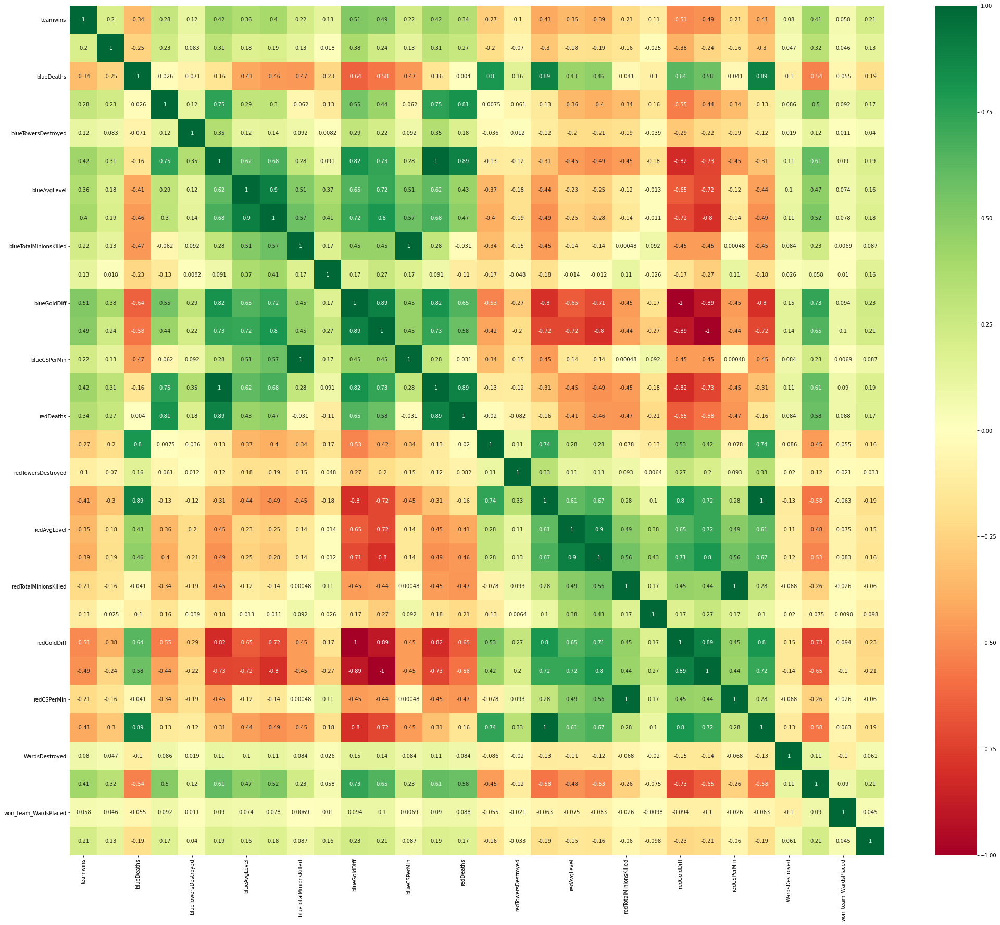

In [16]:
sns.heatmap(df[df.columns[:30]].corr(),annot=True,cmap='RdYlGn')
fig=plt.gcf()
fig.set_size_inches(35,30)
plt.show()

We zie een paar keer een 1 corr dust beteken dat de feature een 1 op 1 corrolatsie heeft. We
zien dit bijn min

minions killed and gold per min om dat minions een vast hoeveelheid gold geeft dus dit is niet heel raar.
Veder zien we een negatiefe corr tussen somingen feature in blue and red bij kills and dead's.

In [17]:
corr =df.corr()
corr['teamwins'].sort_values()

redGoldDiff                    -0.511119
redExperienceDiff              -0.489558
redGoldPerMin                  -0.411396
redTotalGold                   -0.411396
redTotalExperience             -0.387588
redAvgLevel                    -0.352127
blueDeaths                     -0.339297
redAssists                     -0.271047
redCSPerMin                    -0.212171
redTotalMinionsKilled          -0.212171
redTotalJungleMinionsKilled    -0.110994
redTowersDestroyed             -0.103696
won_team_WardsPlaced            0.057599
WardsDestroyed                  0.079800
Heralds_Winning                 0.092385
blueTowersDestroyed             0.115566
blueTotalJungleMinionsKilled    0.131445
FirstBlood                      0.201769
Dragons_Winning                 0.213768
EliteMonsters                   0.222784
blueCSPerMin                    0.224909
blueTotalMinionsKilled          0.224909
blueAssists                     0.276685
redDeaths                       0.337358
blueAvgLevel    

feature keuze

blueAvgLevel                    0.357820<br/>
blueTotalExperience             0.396141<br/>
more_Kills                      0.410042<br/>
blueTotalGold                   0.417213<br/>
blueGoldPerMin                  0.417213<br/>
blueExperienceDiff              0.489558<br/>
blueGoldDiff                    0.511119<br/>
redGoldDiff                    -0.511119<br/>
redExperienceDiff              -0.489558<br/>
redGoldPerMin                  -0.411396<br/>
redTotalGold                   -0.411396<br/>
redTotalExperience             -0.387588<br/>
redAvgLevel                    -0.352127

## netwerk

Ik denk dat naive bayes en

In [18]:
feature_X = df[["blueAvgLevel","blueTotalExperience","more_Kills",
                "blueTotalGold","blueGoldPerMin","blueExperienceDiff","blueGoldDiff","redGoldDiff","redExperienceDiff"
                  ,"redGoldPerMin","redTotalGold","redTotalExperience","redAvgLevel"]]
target_y = df['teamwins']
train_X, test_X, train_y, test_y = train_test_split(feature_X, target_y, test_size = 0.20, random_state = 42)

In [19]:
model = KNeighborsClassifier()
model.fit(train_X,
          train_y.values.ravel())
prediction = model.predict(test_X)
resKNN = accuracy_score(test_y, prediction)
print('The accuracy of the KNN is', resKNN)
unique, counts = np.unique(prediction, return_counts=True)
print(unique)
print(counts)

The accuracy of the KNN is 0.6887651821862348
[0 1]
[1020  956]


In [20]:
model = LogisticRegression()
model.fit(train_X, train_y.values.ravel())
prediction = model.predict(test_X)
resLog = accuracy_score(test_y, prediction)
print('The accuracy of the Logistic regression is', resLog)
unique, counts = np.unique(prediction, return_counts=True)
print(unique)
print(counts)


The accuracy of the Logistic regression is 0.7236842105263158
[0 1]
[985 991]


In [21]:
model = DecisionTreeClassifier()
model.fit(train_X,train_y)
prediction = model.predict(test_X)
trees = accuracy_score(test_y, prediction)
print('The accuracy of the tree is',trees)
unique, counts = np.unique(prediction, return_counts=True)
print(unique)
print(counts)

The accuracy of the tree is 0.6346153846153846
[0 1]
[1009  967]


The accuracy of the Forest is 0.7019230769230769
[0 1]
[1006  970]


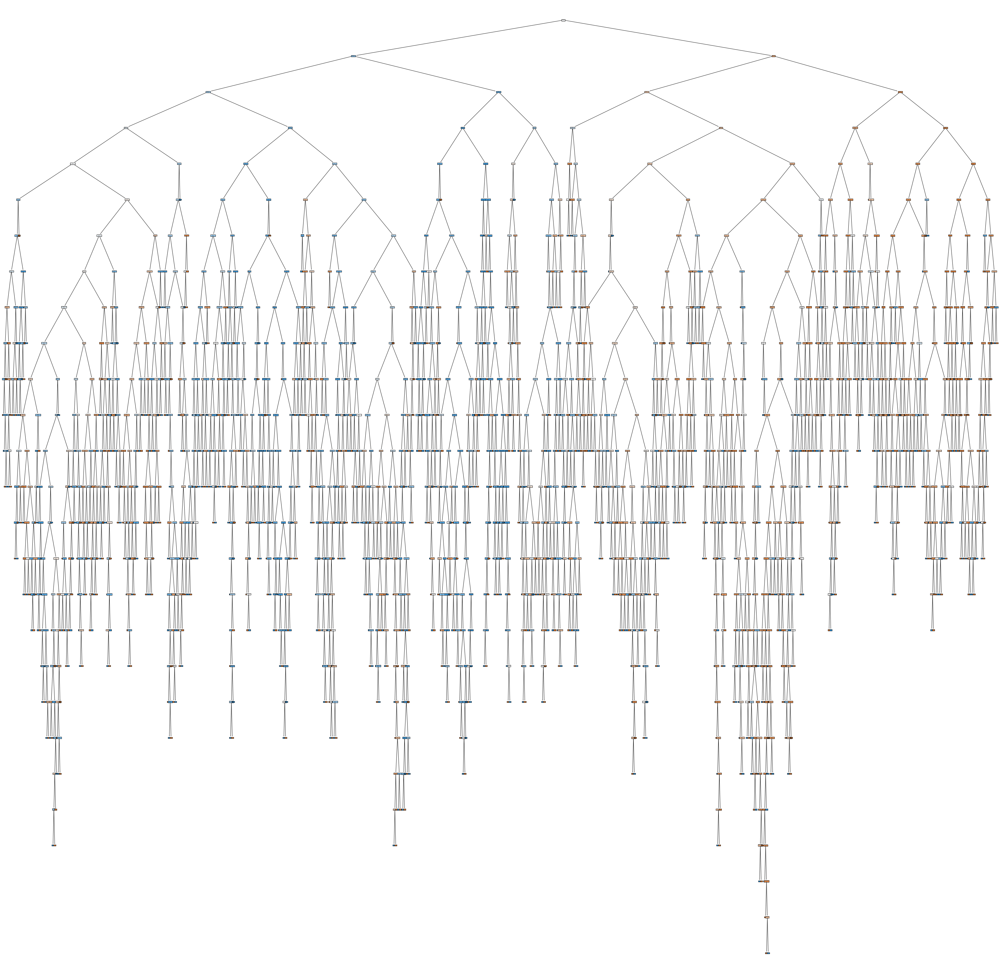

In [22]:
model = RandomForestClassifier()
model.fit(train_X,train_y)
prediction = model.predict(test_X)
Forest = accuracy_score(test_y, prediction)
print('The accuracy of the Forest is',Forest)
unique, counts = np.unique(prediction, return_counts=True)
print(unique)
print(counts)
from sklearn import tree
plt.figure(figsize=(60,60))
tree_ = tree.plot_tree(model.estimators_[0], feature_names=train_X.columns, filled=True)

In [23]:
from sklearn.naive_bayes import GaussianNB
model=GaussianNB()
model.fit(train_X,train_y.values.ravel())
prediction=model.predict(test_X)
resNB = accuracy_score(test_y, prediction)
print('The accuracy of the naive bayes is', resNB)
unique, counts = np.unique(prediction, return_counts=True)
print(unique)
print(counts)

The accuracy of the naive bayes is 0.7191295546558705
[0 1]
[984 992]


In [24]:
print('The accuracy of the naive bayes is', resNB)
print('The accuracy of the Forest is',Forest)
print('The accuracy of the tree is',trees)
print('The accuracy of the Logistic regression is', resLog)
print('The accuracy of the KNN is', resKNN)

The accuracy of the naive bayes is 0.7191295546558705
The accuracy of the Forest is 0.7019230769230769
The accuracy of the tree is 0.6346153846153846
The accuracy of the Logistic regression is 0.7236842105263158
The accuracy of the KNN is 0.6887651821862348


In [25]:
feature_X = df.drop(['teamwins'],axis= 1)
target_y = df['teamwins']
train_X, test_X, train_y, test_y = train_test_split(feature_X, target_y, test_size = 0.20, random_state = 42)

In [26]:
model = KNeighborsClassifier()
model.fit(train_X,
          train_y.values.ravel())
prediction = model.predict(test_X)
resKNN_all = accuracy_score(test_y, prediction)
print('The accuracy of the KNN is', resKNN_all)
unique, counts = np.unique(prediction, return_counts=True)
print(unique)
print(counts)

The accuracy of the KNN is 0.6887651821862348
[0 1]
[1020  956]


In [27]:
model = LogisticRegression()
model.fit(train_X, train_y.values.ravel())
prediction = model.predict(test_X)
resLog_all = accuracy_score(test_y, prediction)
print('The accuracy of the Logistic regression is', resLog_all)
unique, counts = np.unique(prediction, return_counts=True)
print(unique)
print(counts)


The accuracy of the Logistic regression is 0.722165991902834
[0 1]
[980 996]


In [28]:
model = DecisionTreeClassifier()
model.fit(train_X,train_y)
prediction = model.predict(test_X)
tree_all = accuracy_score(test_y, prediction)
print('The accuracy of the tree is',tree_all)
unique, counts = np.unique(prediction, return_counts=True)
print(unique)
print(counts)

The accuracy of the tree is 0.6371457489878543
[0 1]
[ 970 1006]


In [29]:
model = RandomForestClassifier()
model.fit(train_X,train_y)
prediction = model.predict(test_X)
Forest_all = accuracy_score(test_y, prediction)
print('The accuracy of the Forest is',Forest_all)
unique, counts = np.unique(prediction, return_counts=True)
print(unique)
print(counts)

The accuracy of the Forest is 0.7206477732793523
[0 1]
[1005  971]


In [30]:
from sklearn.naive_bayes import GaussianNB
model=GaussianNB()
model.fit(train_X,train_y.values.ravel())
prediction=model.predict(test_X)
resNB_all = accuracy_score(test_y, prediction)
print('The accuracy of the naive bayes is', resNB_all)
unique, counts = np.unique(prediction, return_counts=True)
print(unique)
print(counts)

The accuracy of the naive bayes is 0.7206477732793523
[0 1]
[989 987]


In [31]:
print('The accuracy of the naive bayes is', resNB)
print('The accuracy of the naive bayes_all is', resNB_all)
print('The accuracy of the Forest is',Forest)
print('The accuracy of the Forest_all is',Forest_all)
print('The accuracy of the tree is',trees)
print('The accuracy of the tree_all is',tree_all)
print('The accuracy of the Logistic regression is', resLog)
print('The accuracy of the Logistic regression_all is', resLog_all)
print('The accuracy of the KNN is', resKNN)
print('The accuracy of the KNN_all is', resKNN_all)

The accuracy of the naive bayes is 0.7191295546558705
The accuracy of the naive bayes_all is 0.7206477732793523
The accuracy of the Forest is 0.7019230769230769
The accuracy of the Forest_all is 0.7206477732793523
The accuracy of the tree is 0.6346153846153846
The accuracy of the tree_all is 0.6371457489878543
The accuracy of the Logistic regression is 0.7236842105263158
The accuracy of the Logistic regression_all is 0.722165991902834
The accuracy of the KNN is 0.6887651821862348
The accuracy of the KNN_all is 0.6887651821862348


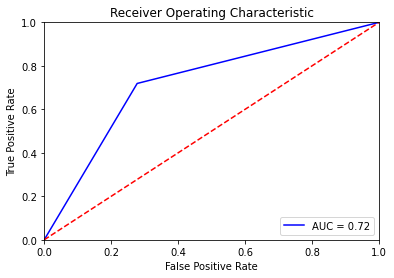

In [32]:
fpr, tpr, threshold = roc_curve(test_y, prediction)
roc_auc = auc(fpr, tpr)

plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

Supervised learning
bron:https://machinelearningmastery.com/supervised-and-unsupervised-machine-learning-algorithms/

ROC curve
bron:https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html

SVM
bron:https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html
Bron:https://towardsdatascience.com/support-vector-machine-simply-explained-fee28eba5496

Logistic Regression
bron:https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html
bron:https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3936971/#:~:text=Logistic%20regression%20is%20used%20to,the%20observed%20event%20of%20interest.

Ensemble methods
bron:https://scikit-learn.org/stable/modules/ensemble.html

Cross validation
bron:https://scikit-learn.org/stable/modules/cross_validation.html

Overfitting, underfitting
bron:https://towardsdatascience.com/what-are-overfitting-and-underfitting-in-machine-learning-a96b30864690

Kiezen van de juiste methode
bron:- les





